In [1]:
import os
import random

import numpy as np
import pandas as pd

import matplotlib
import matplotlib.pyplot as plt
matplotlib.rcParams['figure.figsize'] = [5, 5]
matplotlib.rcParams['figure.dpi'] = 200

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision

from data_helper import UnlabeledDataset, LabeledDataset
from helper import collate_fn, draw_box
import time

In [2]:
from resnet_model import Bottleneck, ResNet
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [3]:
# All the images are saved in image_folder
# All the labels are saved in the annotation_csv file
image_folder = 'data'
annotation_csv = 'data/annotation.csv'
# You shouldn't change the unlabeled_scene_index
# The first 106 scenes are unlabeled
unlabeled_scene_index = np.arange(106)
# The scenes from 106 - 133 are labeled
# You should devide the labeled_scene_index into two subsets (training and validation)
labeled_scene_index = np.arange(106, 134)


NUM_SAMPLE_PER_SCENE = 126
NUM_IMAGE_PER_SAMPLE = 6
image_names = [
    'CAM_FRONT_LEFT.jpeg',
    'CAM_FRONT.jpeg',
    'CAM_FRONT_RIGHT.jpeg',
    'CAM_BACK_LEFT.jpeg',
    'CAM_BACK.jpeg',
    'CAM_BACK_RIGHT.jpeg',
    ]

from PIL import Image

In [4]:
# You shouldn't change the unlabeled_scene_index
# The first 106 scenes are unlabeled
unlabeled_scene_index = np.arange(106)
# The scenes from 106 - 133 are labeled
# You should devide the labeled_scene_index into two subsets (training and validation)
labeled_scene_index = np.arange(106, 134)

In [5]:
random.seed(1008)
random.shuffle(unlabeled_scene_index)
train_scene = unlabeled_scene_index[:85]
val_scene = unlabeled_scene_index[85:]

transform = torchvision.transforms.ToTensor()

unlabeled_trainset = UnlabeledDataset(image_folder=image_folder, 
                                      scene_index=train_scene, 
                                      first_dim='image', transform=transform)
unlabeled_valset = UnlabeledDataset(image_folder = image_folder, 
                                    scene_index = val_scene, 
                                    first_dim = 'image', transform = transform)

In [6]:
train_loader = torch.utils.data.DataLoader(unlabeled_trainset, batch_size=1, 
                                           shuffle = True, num_workers=2)
val_loader = torch.utils.data.DataLoader(unlabeled_valset, batch_size=1, 
                                         shuffle = True, num_workers=2)

In [7]:
image, camera_index = iter(train_loader).next()

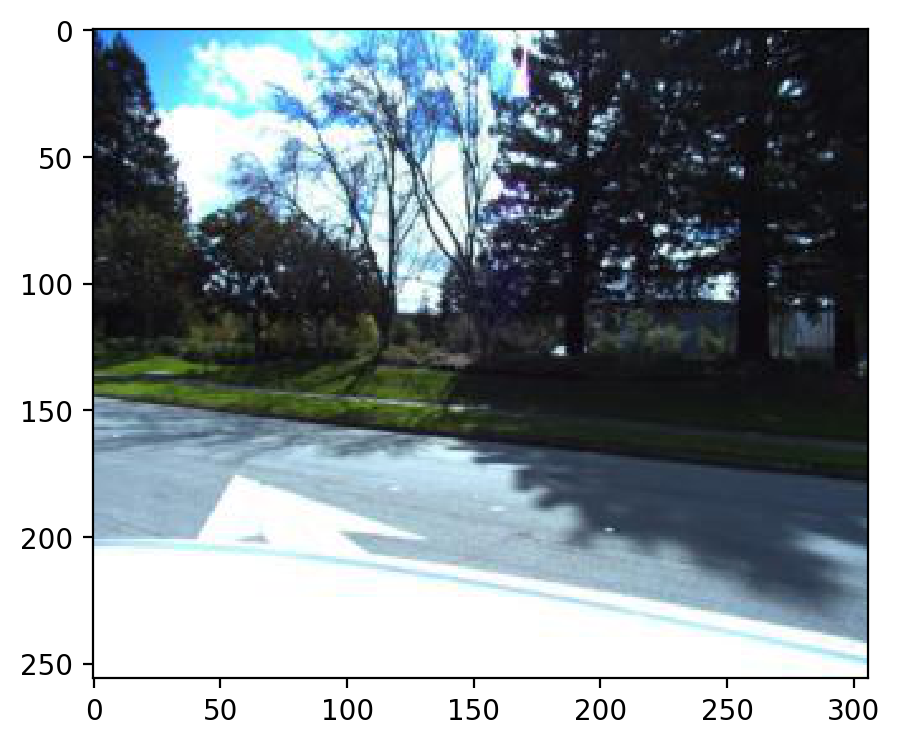

In [8]:
plt.imshow(image[0].numpy().transpose(1,2,0))

In [9]:
# Encoder matters more
encoder = ResNet(Bottleneck, [3,4,6,4], num_classes = 4)
encoder = nn.Sequential(*list(encoder.children())[:-3])


In [10]:
class encoder_for_vae(nn.Module):

    def __init__(self):
        super(encoder_for_vae, self).__init__()

        self.conv = nn.Sequential(
            nn.Conv2d(1024, 512, 3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 128, 3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2)
        )

        self.mu_dec = nn.Linear(10240, 512)
        self.logvar_dec = nn.Linear(10240, 512)

    def forward(self, x):
        x = self.conv(x)
        x = x.view(-1, 10240)
        mu = self.mu_dec(x)
        logvar = self.logvar_dec(x)

        return mu, logvar

In [11]:
def get_upsampling_weight(in_channels, out_channels, kernel_size):
    """Make a 2D bilinear kernel suitable for upsampling"""
    factor = (kernel_size + 1) // 2
    if kernel_size % 2 == 1:
        center = factor - 1
    else:
        center = factor - 0.5
    og = np.ogrid[:kernel_size, :kernel_size]
    filt = (1 - abs(og[0] - center) / factor) * \
           (1 - abs(og[1] - center) / factor)
    weight = np.zeros((in_channels, out_channels, kernel_size, kernel_size),
                      dtype=np.float64)
    weight[range(in_channels), range(out_channels), :, :] = filt
    return torch.from_numpy(weight).float()

In [12]:
class _SameDecoder(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride, num_layers, out_activation = 'relu'):
        super(_SameDecoder, self).__init__()
        layers = [
            nn.ConvTranspose2d(in_channels, in_channels, kernel_size=kernel_size, stride=stride),
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        ]
        layers += [
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True) 
        ]*(num_layers-2)
        
        layers += [
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True) if out_activation == 'relu' else nn.Sigmoid(),
        ]
        self.decode = nn.Sequential(*layers)
    def forward(self, x):
        return self.decode(x)
        

In [13]:
class decoder_conv(nn.Module):
    def __init__(self):
        super(decoder_conv, self).__init__()
        self.dec1 = _SameDecoder(128, 256,kernel_size=2, stride=2, num_layers=4)
        self.dec2 = _SameDecoder(256, 256,kernel_size=3, stride=3, num_layers=4)
        self.dec3 = _SameDecoder(256, 256,kernel_size=2, stride=2, num_layers=4)
        self.dec4 = _SameDecoder(256, 256,kernel_size=2, stride=2, num_layers=2)
        self.dec5 = _SameDecoder(256, 256,kernel_size=2, stride=2, num_layers=2)
        self.dec6 = _SameDecoder(256, 256,kernel_size=2, stride=2, num_layers=2)

        self.dec7 = _SameDecoder(256, 128,kernel_size=2, stride=2, num_layers=2)
        self.conv_out = nn.Conv2d(128, 3,3 , padding=1)
        self.final_upsample = nn.Upsample((256, 306), mode='bilinear', align_corners=False)
        self.sigmoid = nn.Sigmoid()
        self._initialize_weights()
        
    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.ConvTranspose2d):
                assert m.kernel_size[0] == m.kernel_size[1]
                initial_weight = get_upsampling_weight(
                    m.in_channels, m.out_channels, m.kernel_size[0])
                m.weight.data.copy_(initial_weight)
                
    def forward(self, x):
        x = x.view(-1, 128, 2, 2)
        x = self.dec1(x)
        x= self.dec2(x)
        x = self.dec3(x)
        x = self.dec4(x)
        x = self.dec5(x)
        x = self.dec6(x)
        x = self.dec7(x)
        x = self.conv_out(x)
        # print('after layers the size is', x.size())
        x = self.final_upsample(x)
        x = self.sigmoid(x)
        return x

In [14]:
class vae_mapping_image(nn.Module):
    def __init__(self):
        super(vae_mapping_image, self).__init__()
        
        self.feature_extractor = torchvision.models.resnet50(pretrained = False)
        self.encoder = list(self.feature_extractor.children())[:-3]
        self.encoder = nn.Sequential(*self.encoder)
        self.encoder_for_vae = encoder_for_vae()
        self.decoder = decoder_conv()
        
    def reparameterize(self, is_training, mu, logvar):
        if is_training:
            std = torch.exp(0.5*logvar)
            eps = torch.randn_like(std)
            return eps.mul(std).add_(mu)
        else:
            return mu
        
    def forward(self, x, is_training, defined_mu = None):
        feature_maps = self.encoder(x)
        mu, logvar = self.encoder_for_vae(feature_maps)
        z = self.reparameterize(is_training, mu, logvar)
        
        pred_map = self.decoder(z)
        
        return pred_map, mu, logvar

In [15]:
def loss_function(criterion, prediction, target, mu, logvar):
    LOSS = criterion(prediction, target)
    KLD = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())

    return 0.9*LOSS + 0.1*KLD

In [26]:
def train_eval_model(model, train_loader, val_loader, criterion, optimizer, 
                    num_epochs, checkpoint, to_save, eval_every=500, print_every = 1000):
    model.train()
    if checkpoint:
        print('loading weights')
        pt = torch.load(checkpoint)
        model.load_state_dict(pt['best_model'])
        optimizer.load_state_dict(pt['optimizer'])
        best_loss = pt['best_loss']
        print(best_loss)
    else:
        best_loss  =1e10
    
    loss_dict = {'train':[], 'val': []}
    acc_list = []
    curr_iteration = 0
    curr_loss = 0.0
    total_iteration = 0
    for epoch in range(num_epochs):
        epoch_start  =time.time()
        print('Epoch {}/{}'.format(epoch+1, num_epochs))
        print('-'*10)
        for i, (image, camera_index) in enumerate(train_loader):
            train_start = time.time()
            image = image.to(device)
            
            optimizer.zero_grad()
            outputs, mu, logvar = model(image, is_training = True)
            
            loss = loss_function(criterion, outputs.cpu(), image.cpu(), mu.cpu(), logvar.cpu())
            
            curr_loss += loss.item()
            loss.backward()
            optimizer.step()
            
            curr_iteration +=1
            total_iteration +=1
            
            if curr_iteration % eval_every == 0:
                curr_loss/=(curr_iteration*BATCH_SIZE)
                loss_dict['train'].append(curr_loss)
                print('Current training loss is %f'%(curr_loss))
                print('Training iteration %d takes %f'%(curr_iteration, time.time() - train_start))
                train_start = time.time()
                curr_loss = 0.0
                
                eval_loss = 0.0
                total = 0
                model.eval()
                val_start = time.time()
                with torch.no_grad():
                    for i, (image, _) in enumerate(val_loader):
                        image = image.to(device)
                        outputs, mu, logvar = model(image, is_training= False)
                        loss = loss_function(criterion, outputs.cpu(), image.cpu(), mu.cpu(), logvar.cpu())
                        eval_loss += loss.item()
                        total += image.size(0)
                        
                eval_loss/=total
                loss_dict['val'].append(eval_loss)
                
                print('Current validatoin loss is %f'%(eval_loss))
                print('Current validation takes %f'%(time.time() - val_start))
                
                if eval_loss < best_loss:
                    print('saving best model')
                    best_loss = eval_loss
                    checkpoint = {'best_model': model.state_dict(), 
                                  'optimizer': optimizer.state_dict(), 
                                  'best_loss': best_loss}
                    torch.save(checkpoint, to_save)
                    
                   
                    
                if total_iteration %print_every == 0:
                    print('printing test image')
                    fig, ax = plt.subplots(5, 2, figsize=(15,30))
                    test_idx = [3, 419, 1931, 2675, 3887]
                    for fig_i, i in enumerate(test_idx):
                        inputs = unlabeled_valset[i][0].unsqueeze(0).to(device)
                        with torch.no_grad():
                            outputs = model(inputs, is_training=False)[0].cpu().squeeze().detach()

                        ax[fig_i, 0].imshow(unlabeled_valset[i][0].cpu().numpy().transpose(1,2,0))

                        ax[fig_i, 1].imshow(outputs.cpu().detach().numpy().transpose(1,2,0))
                    plt.show()
            
                curr_iteration = 0
                model.train()
                
        print('Current epoch takes%f min' %(time.time() - epoch_start)/60)
    for key in list(loss_dict.keys()):
        if len(loss_dict[key]) > 0:
            fig = plt.figure()
            plt.plot(loss_dict[key])
            plt.title('%s loss per epoch '%(key))
            plt.show()
            
    return model, loss_dict
                    
                
                
                

In [17]:
BATCH_SIZE=1

In [18]:
mini_set, _ = torch.utils.data.random_split(unlabeled_trainset, [5, len(unlabeled_trainset) - 5])
mini_val, _ = torch.utils.data.random_split(unlabeled_valset, [3, len(unlabeled_valset)-3])

mini_loader = torch.utils.data.DataLoader(mini_set, batch_size = BATCH_SIZE, 
                                          shuffle = True, num_workers = 2)

mini_val_loader = torch.utils.data.DataLoader(mini_val, batch_size = BATCH_SIZE, 
                                          shuffle = True, num_workers = 2)


In [19]:
len(train_loader)

64260

Epoch 1/5
----------
Current training loss is 0.064496
Training iteration 10000 takes 0.106615
Current validatoin loss is 0.053529
Current validation takes 432.174983
saving best model
Current training loss is 0.051364
Training iteration 10000 takes 0.109546
Current validatoin loss is 0.047224
Current validation takes 416.003282
saving best model
Current training loss is 0.046979
Training iteration 10000 takes 0.116605
Current validatoin loss is 0.045832
Current validation takes 425.586782
saving best model
printing test image


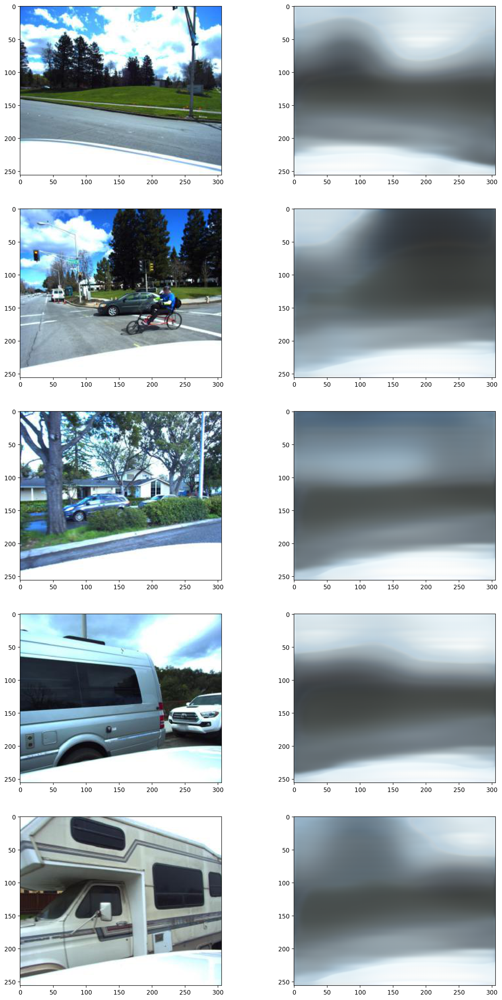

Current training loss is 0.045123
Training iteration 10000 takes 0.114471
Current validatoin loss is 0.048988
Current validation takes 446.492186
Current training loss is 0.041492
Training iteration 10000 takes 0.117858
Current validatoin loss is 0.042728
Current validation takes 409.201499
saving best model
Current training loss is 0.038869
Training iteration 10000 takes 0.110514
Current validatoin loss is 0.051100
Current validation takes 453.365048
printing test image


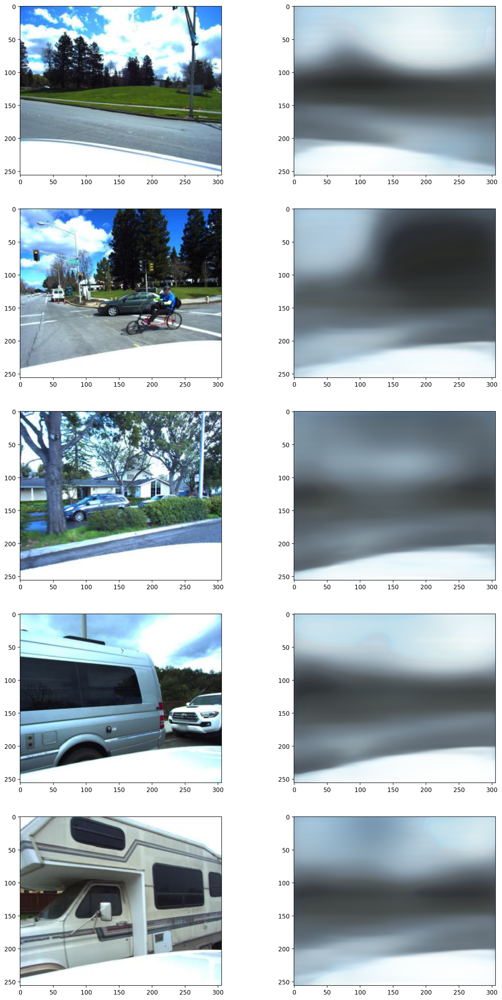

Current epoch takes9736.358009 min
Epoch 2/5
----------
Current training loss is 0.045806
Training iteration 10000 takes 0.108351
Current validatoin loss is 0.042097
Current validation takes 448.593405
saving best model
Current training loss is 0.036731
Training iteration 10000 takes 0.108742
Current validatoin loss is 0.042747
Current validation takes 452.579510
Current training loss is 0.036013
Training iteration 10000 takes 0.107938
Current validatoin loss is 0.040430
Current validation takes 434.068658
saving best model
printing test image


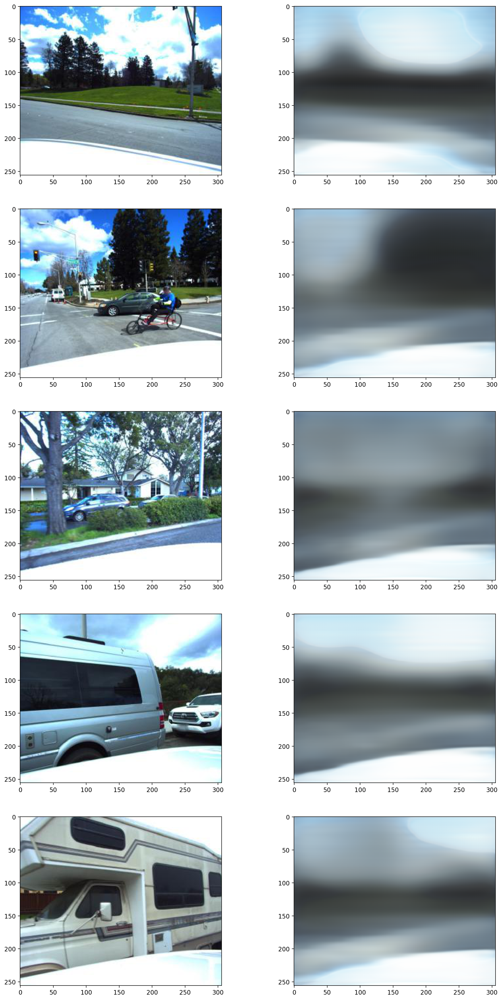

Current training loss is 0.035643
Training iteration 10000 takes 0.104427
Current validatoin loss is 0.042142
Current validation takes 427.635065
Current training loss is 0.034926
Training iteration 10000 takes 0.104398
Current validatoin loss is 0.040765
Current validation takes 429.145810
Current training loss is 0.034285
Training iteration 10000 takes 0.104899
Current validatoin loss is 0.044032
Current validation takes 430.808307
printing test image


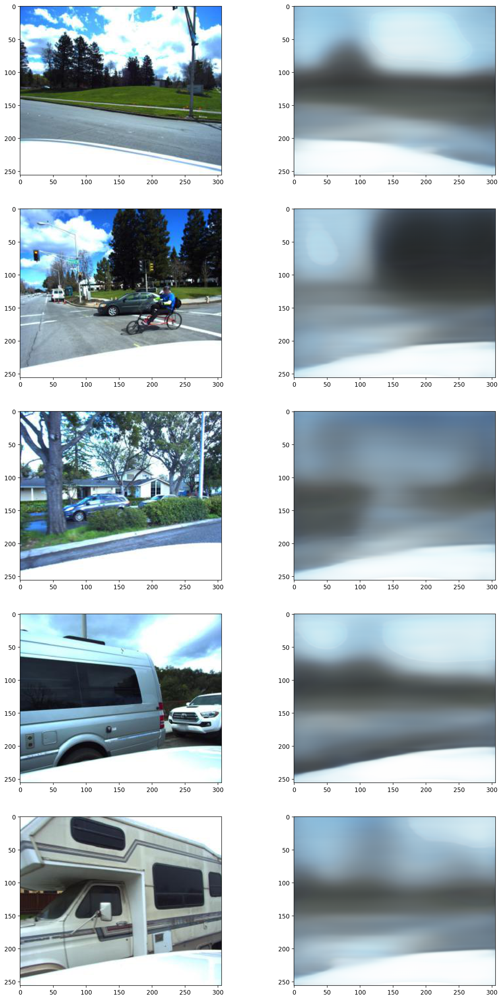

Current epoch takes9479.596212 min
Epoch 3/5
----------
Current training loss is 0.033696
Training iteration 10000 takes 0.084663
Current validatoin loss is 0.041339
Current validation takes 429.238712
Current training loss is 0.032974
Training iteration 10000 takes 0.104001
Current validatoin loss is 0.053714
Current validation takes 407.117783
Current training loss is 0.032667
Training iteration 10000 takes 0.103279
Current validatoin loss is 0.042772
Current validation takes 430.682477
printing test image


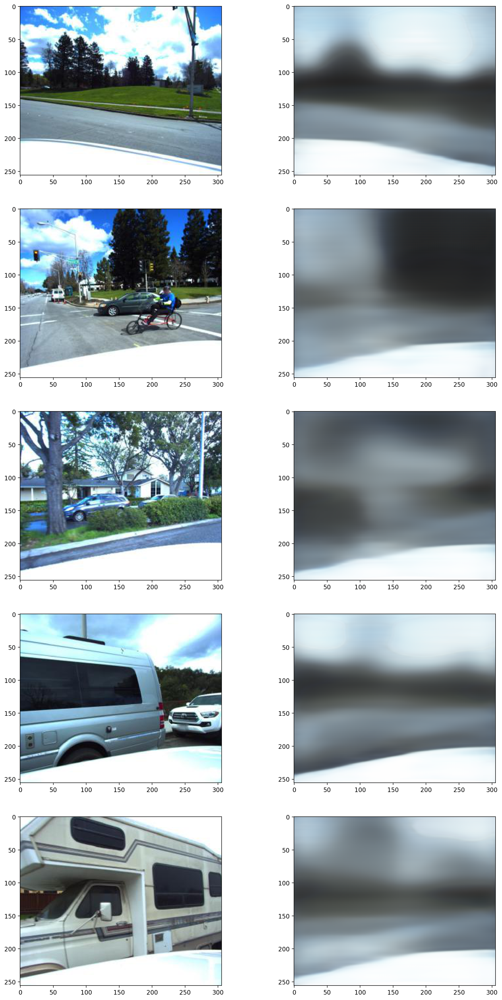

Current training loss is 0.032277
Training iteration 10000 takes 0.108093
Current validatoin loss is 0.039385
Current validation takes 427.369962
saving best model
Current training loss is 0.031657
Training iteration 10000 takes 0.103868
Current validatoin loss is 0.041189
Current validation takes 432.698648
Current training loss is 0.031560
Training iteration 10000 takes 0.104817
Current validatoin loss is 0.041249
Current validation takes 430.035543
printing test image


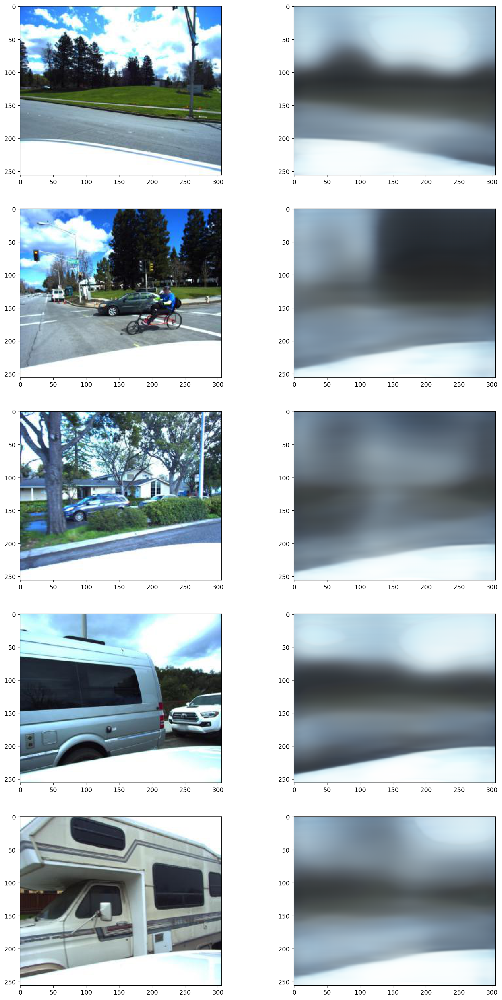

Current training loss is 0.031160
Training iteration 10000 takes 0.101212
Current validatoin loss is 0.037839
Current validation takes 427.753348
saving best model
Current epoch takes9753.500186 min
Epoch 4/5
----------
Current training loss is 0.030832
Training iteration 10000 takes 0.116190
Current validatoin loss is 0.039541
Current validation takes 391.690667
Current training loss is 0.030660
Training iteration 10000 takes 0.106659
Current validatoin loss is 0.039890
Current validation takes 447.551333
printing test image


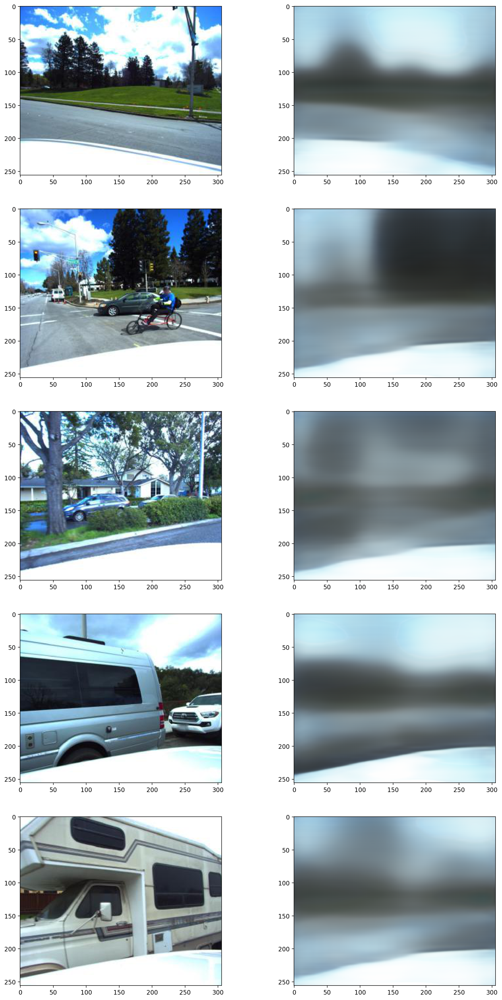

Current training loss is 0.030026
Training iteration 10000 takes 0.107674
Current validatoin loss is 0.037846
Current validation takes 450.650167
Current training loss is 0.030467
Training iteration 10000 takes 0.114815
Current validatoin loss is 0.037533
Current validation takes 421.474442
saving best model
Current training loss is 0.029649
Training iteration 10000 takes 0.109641
Current validatoin loss is 0.039985
Current validation takes 447.987297
printing test image


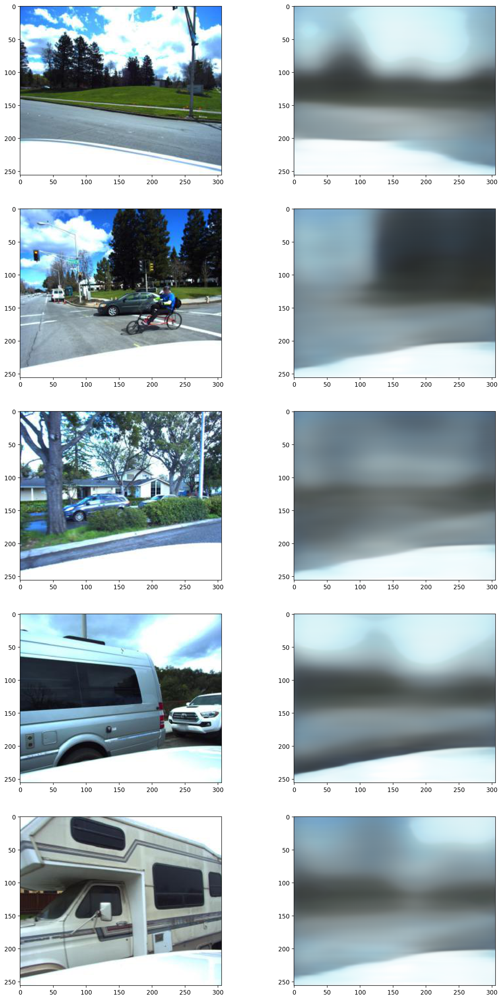

Current training loss is 0.029577
Training iteration 10000 takes 0.120021
Current validatoin loss is 0.040483
Current validation takes 403.006991


In [ ]:
criterion = nn.MSELoss()
my_model = vae_mapping_image().to(device)


optimizer2 = torch.optim.Adam(my_model.parameters(), lr=1e-4)

optimizer = torch.optim.SGD(my_model.parameters(), lr = 1e-2, momentum=0.9)


model, loss_dict = train_eval_model(my_model, train_loader, val_loader, criterion, optimizer2, 
                    num_epochs=5, checkpoint=None, to_save='/scratch/ht1162/DLResult/vae_pretrain_image.pth', 
                                    eval_every=10000, print_every = 30000)


In [20]:
criterion = nn.MSELoss()
my_model = vae_mapping_image().to(device)


optimizer2 = torch.optim.Adam(my_model.parameters(), lr=1e-4)

optimizer = torch.optim.SGD(my_model.parameters(), lr = 1e-2, momentum=0.9)


# model, loss_dict = train_eval_model(my_model, train_loader, val_loader, criterion, optimizer2, 
#                     num_epochs=5, checkpoint=None, to_save='/scratch/ht1162/DLResult/vae_pretrain_image.pth', 
#                                     eval_every=10000, print_every = 30000)

In [27]:
model, loss_dict = train_eval_model(my_model, train_loader, val_loader, criterion, optimizer2, 
                    num_epochs=3, checkpoint='/scratch/ht1162/DLResult/vae_pretrain_image.pth', to_save='/scratch/ht1162/DLResult/vae_pretrain_image.pth', 
                                    eval_every=10000, print_every = 30000)

loading weights
0.0375331532665683
Epoch 1/3
----------
Current training loss is 0.029495
Training iteration 10000 takes 0.588324
Current validatoin loss is 0.037664
Current validation takes 3358.102559
Current training loss is 0.029534
Training iteration 10000 takes 0.581079
Current validatoin loss is 0.038708
Current validation takes 3360.183100


KeyboardInterrupt: 